# Object masks in images from prompts with SAM 2

Segment Anything Model 2 (SAM 2) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt. 

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [6]:
run_notebook = True

In [7]:
if run_notebook:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

PyTorch version: 2.8.0+cu129
Torchvision version: 0.23.0+cu129
CUDA is available: True
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 76.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-nh02fn7b
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-nh02fn7b
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | /

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [8]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [9]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [10]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Example image

In [11]:
image = Image.open('./sample1.png')
image = np.array(image.convert("RGB"))

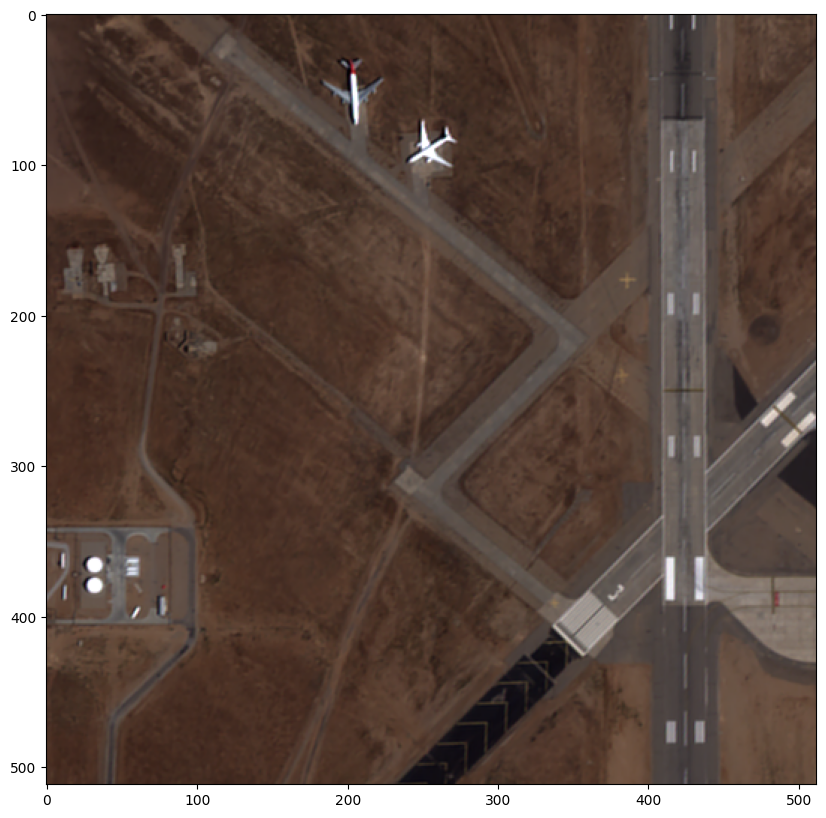

In [12]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

## Selecting objects with SAM 2

First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint. Running on CUDA and using the default model are recommended for best results.

In [13]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction.

In [14]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [29]:
input_point = np.array([[203, 50]])
input_label = np.array([1])

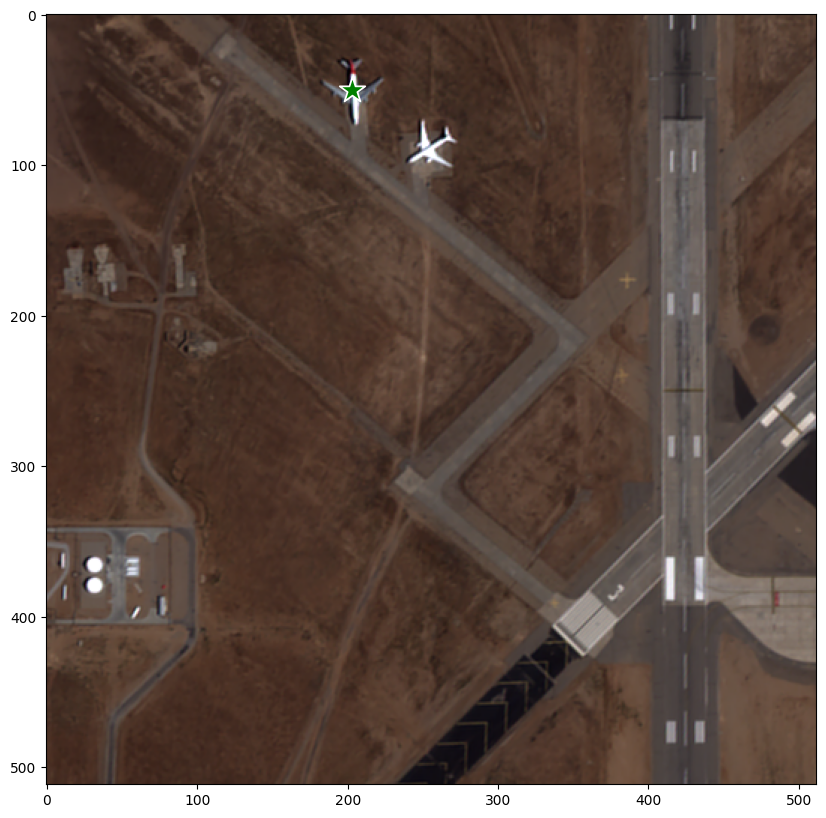

In [30]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [31]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


Predict with `SAM2ImagePredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [32]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

With `multimask_output=True` (the default setting), SAM 2 outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [36]:
masks[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [33]:
masks.shape  # (number_of_masks) x H x W

(3, 512, 512)

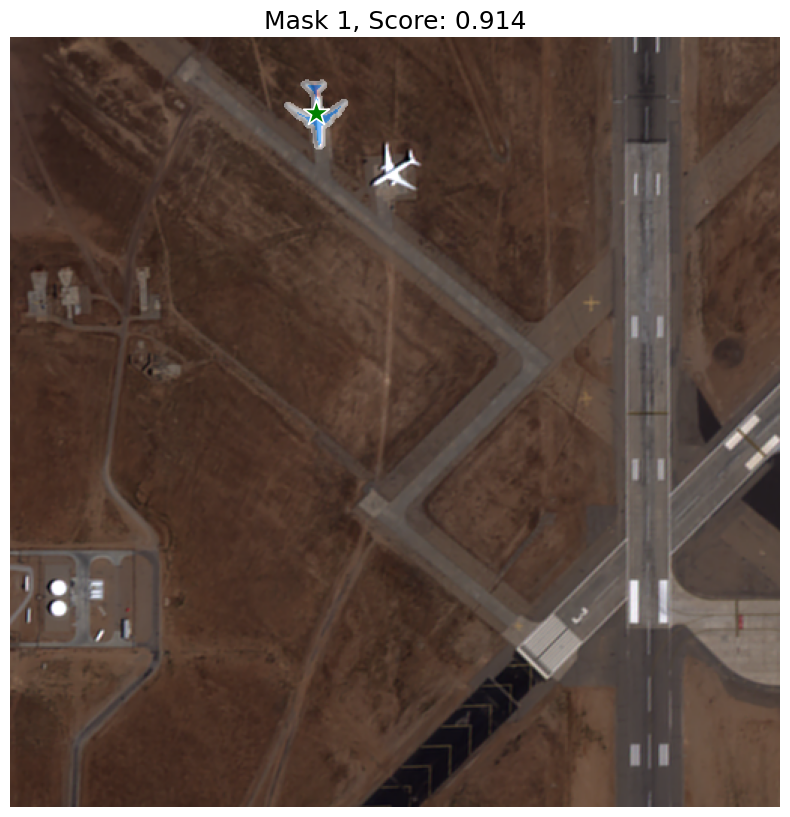

In [37]:
show_masks(image, [masks[0]], scores, point_coords=input_point, input_labels=input_label, borders=True)

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [14]:
input_point = np.array([[165, 217], [260, 318]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [15]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [16]:
masks.shape

(1, 512, 512)

In [40]:
import numpy as np
import cv2
from PIL import Image

# -----------------------------------------------------------
# Helpers
# -----------------------------------------------------------

def overlay_mask_on_image(image, mask, color=(0, 255, 0), alpha=0.6):
    """
    Overlay a semi-transparent color mask on top of an image.
    image: BGR uint8 (H,W,3)
    mask: 0/1 (H,W)
    color: BGR tuple
    alpha: overlay strength
    """
    mask = mask.astype(np.uint8)

    overlay = np.zeros_like(image, dtype=np.uint8)
    overlay[mask == 1] = color

    blended = image.copy()
    blended[mask == 1] = (
        alpha * overlay[mask == 1] +
        (1 - alpha) * blended[mask == 1]
    ).astype(np.uint8)

    return blended


def apply_mask_cutout(image, mask):
    """
    Create a cutout with alpha channel from mask.
    image: BGR uint8
    mask: 0/1 mask
    """
    bgra = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
    bgra[:, :, 3] = (mask * 255).astype(np.uint8)
    return bgra


def paste_processed_back(original, processed, mask):
    """
    Replace only the masked region with processed content.
    original: (H,W,3) BGR
    processed: (H,W,3) BGR (same size)
    mask: 0/1 (H,W)
    """
    out = original.copy()
    m = mask.astype(bool)
    out[m] = processed[m]
    return out


# -----------------------------------------------------------
# 1. RUN SAM PREDICTOR
# -----------------------------------------------------------
# Your SAM code (same as you provided):

# Example:
# image = ...  # load RGB image via PIL or cv2
# predictor.set_image(image)

# First pass:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

# Sort by score descending
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

# Prepare mask_input from best mask
mask_input = logits[np.argmax(scores), :, :]

# Second pass refinement
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

mask = masks[0]   # (H_mask, W_mask)


# -----------------------------------------------------------
# 2. RESIZE MASK TO ORIGINAL IMAGE SIZE
# -----------------------------------------------------------

# Load original image for OpenCV
# If image is PIL:
image_rgb = np.array(image)  
image_cv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

# Otherwise if using cv2 directly:
# image_cv = cv2.imread("input.png")

H, W = image_cv.shape[:2]
mask_resized = cv2.resize(mask.astype(np.uint8), (W, H), interpolation=cv2.INTER_NEAREST)


# -----------------------------------------------------------
# 3. OVERLAY MASK ON THE IMAGE
# -----------------------------------------------------------

overlay = overlay_mask_on_image(
    image=image_cv,
    mask=mask_resized,
    color=(0, 255, 0),   # green overlay
    alpha=0.5
)

cv2.imwrite("overlay_mask.png", overlay)


# -----------------------------------------------------------
# 4. CREATE CUTOUT (transparent PNG)
# -----------------------------------------------------------

cutout = apply_mask_cutout(image_cv, mask_resized)
cv2.imwrite("cutout.png", cutout)


# -----------------------------------------------------------
# 5. PASTE PROCESSED CONTENT BACK
# -----------------------------------------------------------

# Example: suppose you did some processing on the image, e.g. smoothing
processed = cv2.GaussianBlur(image_cv, (11,11), 0)

final_img = paste_processed_back(
    original=image_cv,
    processed=processed,
    mask=mask_resized
)

cv2.imwrite("final_patched.png", final_img)


# -----------------------------------------------------------
# Done — You now have:
#   overlay_mask.png
#   cutout.png
#   final_patched.png
# -----------------------------------------------------------
print("Mask overlay, cutout, and patched outputs written successfully.")


Mask overlay, cutout, and patched outputs written successfully.


In [200]:
from PIL import Image

In [196]:
scores

array([0.90625   , 0.7578125 , 0.39648438], dtype=float32)

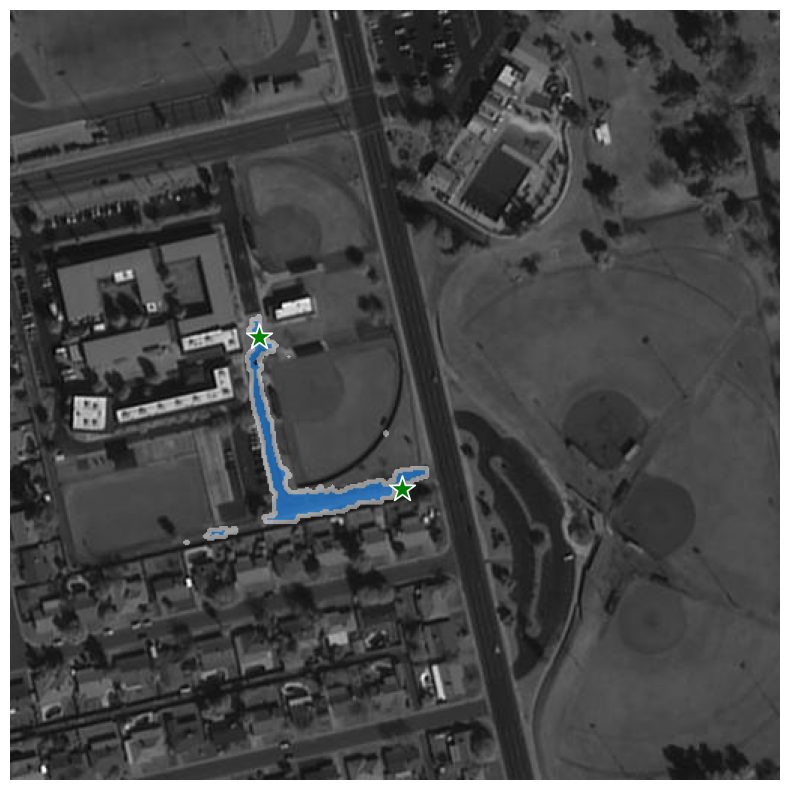

In [20]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [21]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [22]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

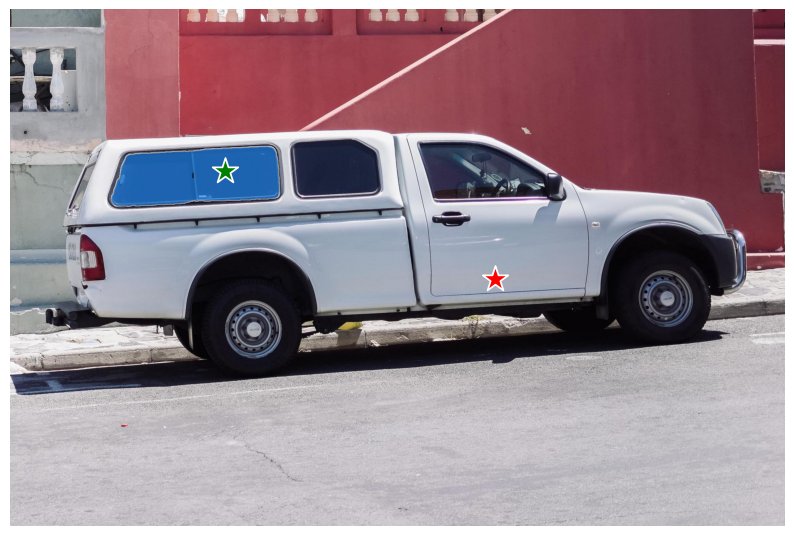

In [23]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [30]:
input_box = np.array([20, 339, 83, 407])

In [31]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

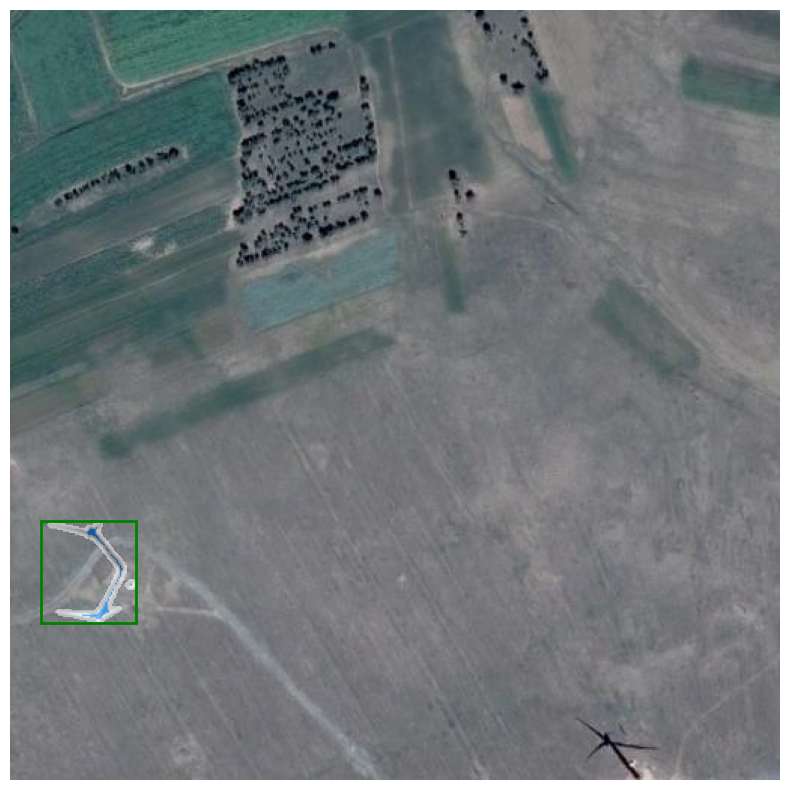

In [32]:
show_masks(image, masks, scores, box_coords=input_box)

In [136]:
scores

array([0.66015625], dtype=float32)

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [27]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [28]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

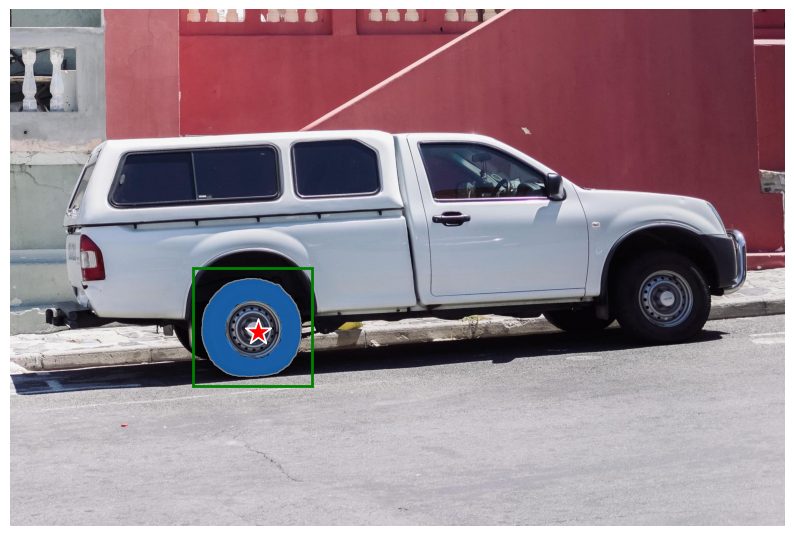

In [29]:
show_masks(image, masks, scores, box_coords=input_box, point_coords=input_point, input_labels=input_label)

## Batched prompt inputs

`SAM2ImagePredictor` can take multiple input prompts for the same image, using `predict` method. For example, imagine we have several box outputs from an object detector.

In [30]:
input_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

In [31]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_boxes,
    multimask_output=False,
)

In [32]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

(4, 1, 1200, 1800)

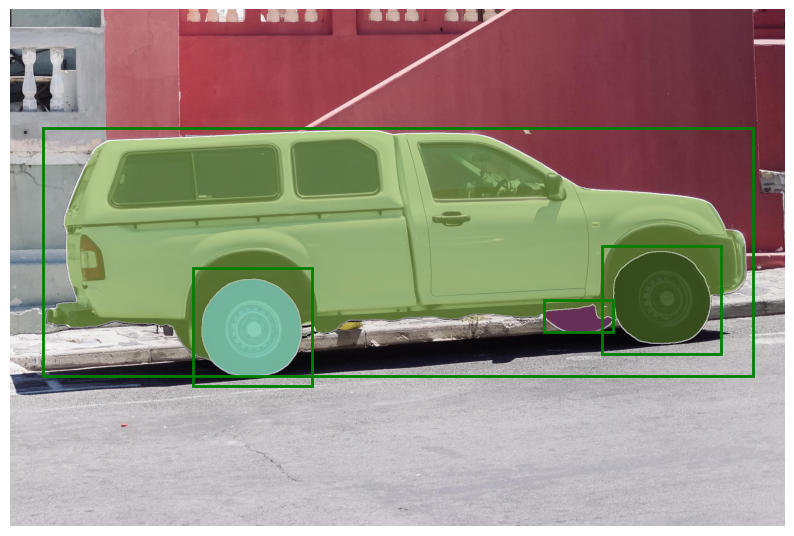

In [33]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.squeeze(0), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box, plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference
If all prompts are available in advance, it is possible to run SAM 2 directly in an end-to-end fashion. This also allows batching over images.

In [34]:
image1 = image  # truck.jpg from above
image1_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

image2 = Image.open('images/groceries.jpg')
image2 = np.array(image2.convert("RGB"))
image2_boxes = np.array([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [35]:
predictor.set_image_batch(img_batch)

In [36]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None, 
    box_batch=boxes_batch, 
    multimask_output=False
)

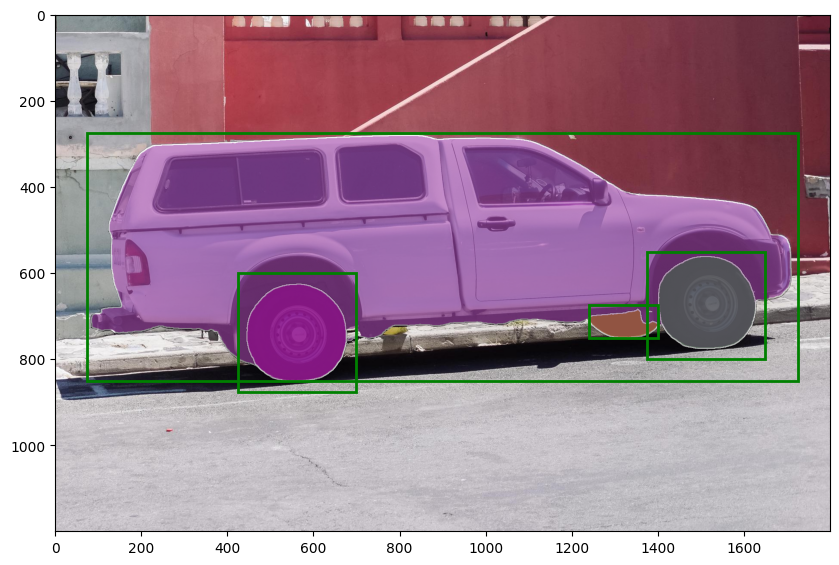

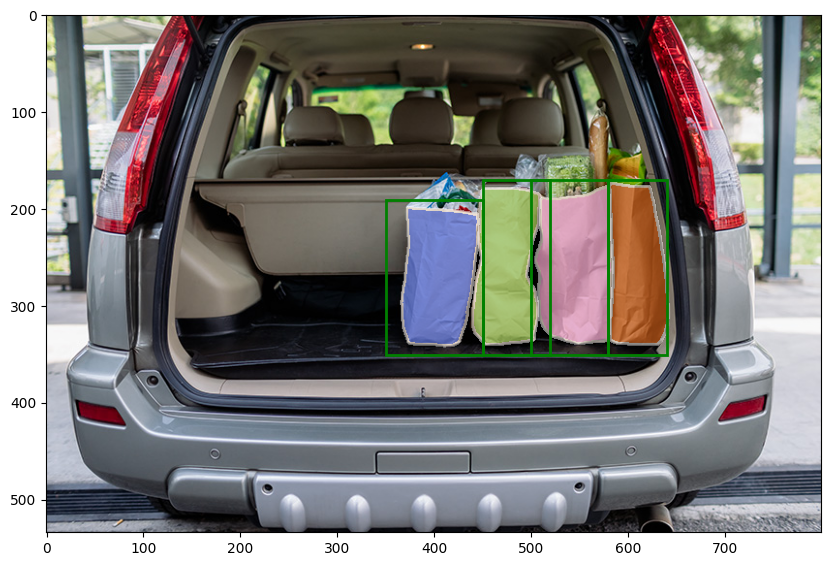

In [37]:
for image, boxes, masks in zip(img_batch, boxes_batch, masks_batch):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)   
    for mask in masks:
        show_mask(mask.squeeze(0), plt.gca(), random_color=True)
    for box in boxes:
        show_box(box, plt.gca())

Similarly, we can have a batch of point prompts defined over a batch of images

In [38]:
image1 = image  # truck.jpg from above
image1_pts = np.array([
    [[500, 375]],
    [[650, 750]]
    ]) # Bx1x2 where B corresponds to number of objects 
image1_labels = np.array([[1], [1]])

image2_pts = np.array([
    [[400, 300]],
    [[630, 300]],
])
image2_labels = np.array([[1], [1]])

pts_batch = [image1_pts, image2_pts]
labels_batch = [image1_labels, image2_labels]

In [39]:
masks_batch, scores_batch, _ = predictor.predict_batch(pts_batch, labels_batch, box_batch=None, multimask_output=True)

# Select the best single mask per object
best_masks = []
for masks, scores in zip(masks_batch,scores_batch):
    best_masks.append(masks[range(len(masks)), np.argmax(scores, axis=-1)])

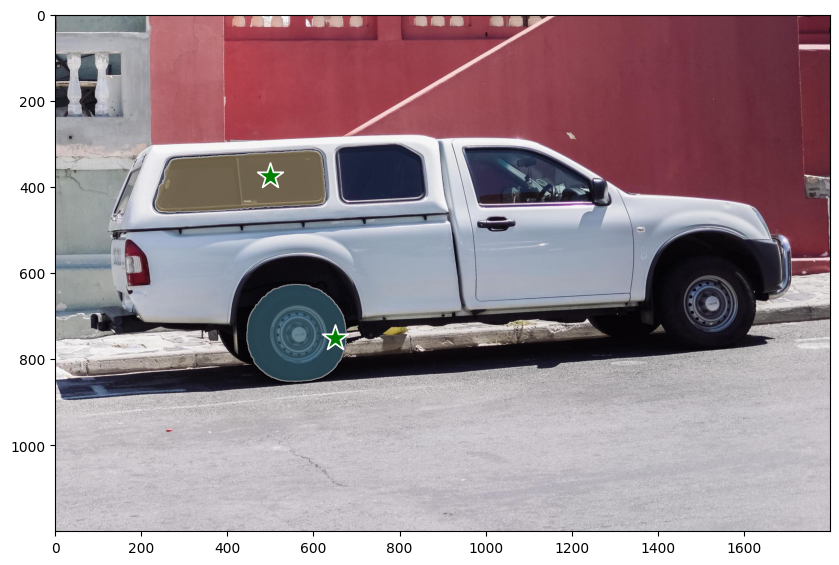

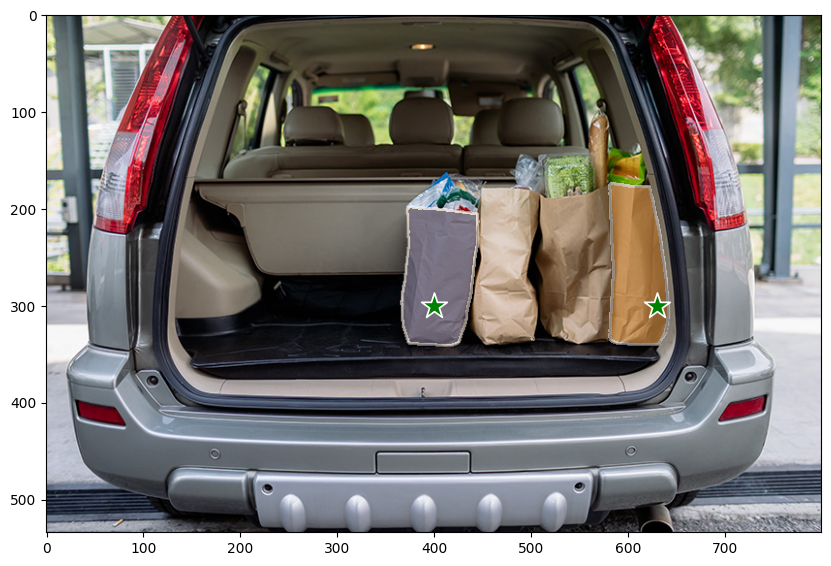

In [40]:
for image, points, labels, masks in zip(img_batch, pts_batch, labels_batch, best_masks):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)   
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
    show_points(points, labels, plt.gca())

# Inference on VRSBench

In [41]:
!curl -L -o Images_val.zip https://huggingface.co/datasets/xiang709/VRSBench/resolve/main/Images_val.zip
!unzip -q Images_val.zip -d Images_val
print("Images downloaded and extracted successfully!")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1353  100  1353    0     0   6936      0 --:--:-- --:--:-- --:--:--  6974
100 3792M  100 3792M    0     0  53.6M      0  0:01:10  0:01:10 --:--:-- 54.0M
Images downloaded and extracted successfully!


In [42]:
import json
with open('output.json', 'r') as f:
    data = json.load(f)

In [83]:
import json
with open('./VRSBench_EVAL_referring.json', 'r') as f:
    eval_data = json.load(f)

In [43]:
data[0]

{'image_id': 'P0003_0002.png',
 'question': 'The large yellow vehicle situated closest to the green area.',
 'ground_truth': [25, 40, 33, 60],
 'bbox': {'x1': 123.904, 'y1': 201.216, 'x2': 170.496, 'y2': 307.712}}

In [123]:
eval_data[15]

{'image_id': 'P0007_0006.png',
 'question': 'The large vehicle positioned at the bottom part of the image.',
 'ground_truth': '{<46><68><75><75>}',
 'dataset': 'RSBench',
 'question_id': 15,
 'type': 'ref',
 'unique': False,
 'obj_corner': [0.7578125,
  0.705078125,
  0.7578125,
  0.751953125,
  0.462890625,
  0.740234375,
  0.466796875,
  0.689453125],
 'obj_cls': 'vehicle',
 'obj_ids': [0],
 'size_group': ''}

In [109]:
image = Image.open(f'Images_val/Images_val/{data[15]['image_id']}')
image = np.array(image.convert("RGB"))
predictor.set_image(image)

In [124]:
input_box = np.array([data[15]['bbox']['x1'], data[15]['bbox']['y1'], data[15]['bbox']['x2'], data[15]['bbox']['y2']])

In [125]:
input_box

array([221.696, 345.088, 392.704, 384.   ])

In [126]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

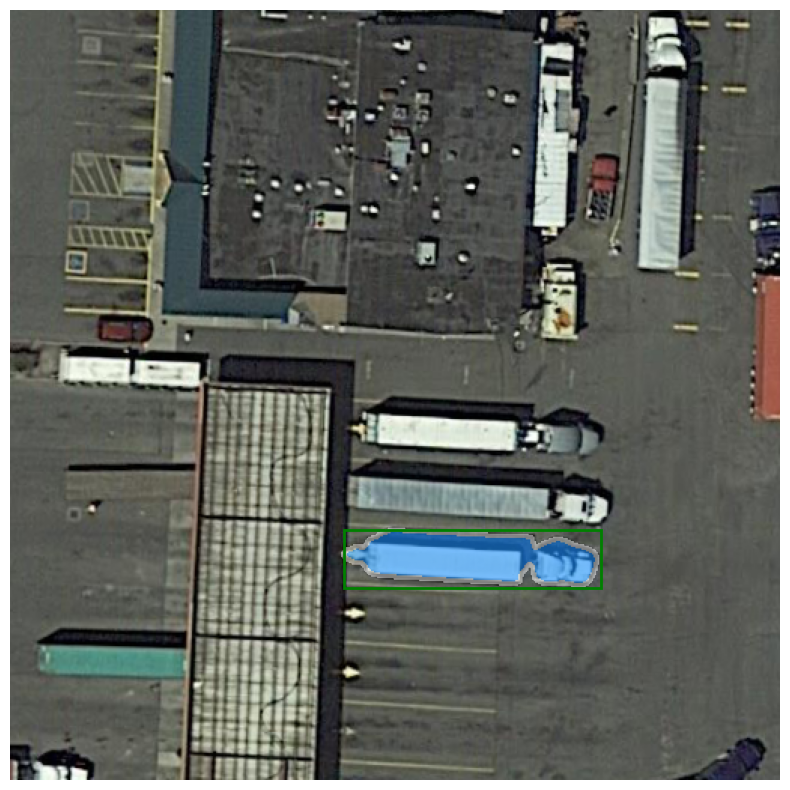

In [127]:
show_masks(image, masks, scores, box_coords=input_box)

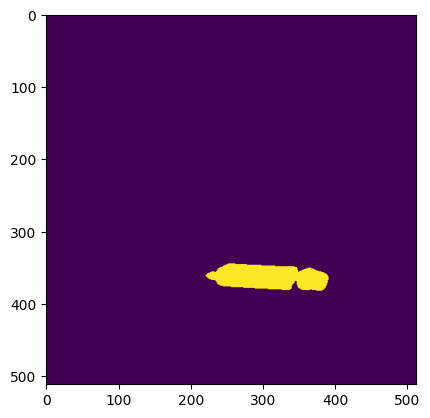

In [128]:
import matplotlib.pyplot as plt
plt.imshow(masks[0])

In [129]:
import cv2
import numpy as np

# Assuming 'segmented_mask' is your binary mask of the segmented object
# (e.g., a NumPy array where object pixels are 255 and background is 0)

# Find contours
def return_box(mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Assuming there's only one main object or you're interested in the largest one
    if contours:
        # Find the largest contour (optional, if multiple objects)
        largest_contour = max(contours, key=cv2.contourArea)
    
        # Calculate the minimum area rotated rectangle
        rect = cv2.minAreaRect(largest_contour)
    
        # Get the four corner points of the rotated rectangle
        box = cv2.boxPoints(rect)
        #box = np.intp(box) # Convert to integer coordinates
        return box


In [130]:
import numpy as np
import cv2

def polygon_area(pts):
    """Return area of polygon using OpenCV contourArea."""
    return abs(cv2.contourArea(pts))

def iou_rotated_rect(rect1_pts, rect2_pts):
    """
    Compute IoU between two rectangles defined by 4 corner points each.
    
    rect1_pts: list/array of 4 (x,y)
    rect2_pts: list/array of 4 (x,y)
    """

    # Ensure numpy float32 for OpenCV
    poly1 = np.array(rect1_pts, dtype=np.float32)
    poly2 = np.array(rect2_pts, dtype=np.float32)

    # Areas of individual polygons
    area1 = polygon_area(poly1)
    area2 = polygon_area(poly2)

    # Find intersection polygon (OpenCV returns None if no intersection)
    inter_pts = cv2.intersectConvexConvex(poly1, poly2)
    if inter_pts[0] > 0:   # inter_pts[0] is the area of intersection
        inter_area = inter_pts[0]
    else:
        inter_area = 0.0

    # Compute IoU
    union_area = area1 + area2 - inter_area
    if union_area <= 0:
        return 0.0

    return inter_area / union_area


In [134]:
box = return_box(masks[0])/512
gt = eval_data[15]['obj_corner']
gt_points = np.array([[gt[0], gt[1]], [gt[2], gt[3]], [gt[4], gt[5]], [gt[6], gt[7]]], dtype=np.float32)

In [136]:
iou_rotated_rect(box, gt_points)

0.6051597375163458

In [131]:
gt_points

array([[0.7578125 , 0.7050781 ],
       [0.7578125 , 0.7519531 ],
       [0.46289062, 0.7402344 ],
       [0.46679688, 0.6894531 ]], dtype=float32)

In [135]:
box

array([[0.4302264 , 0.73406786],
       [0.4333468 , 0.6701004 ],
       [0.76321167, 0.6861914 ],
       [0.76009125, 0.75015885]], dtype=float32)

In [88]:
eval_data[5]['obj_corner']

[0.630859375,
 0.30859375,
 0.658203125,
 0.296875,
 0.681640625,
 0.35546875,
 0.6484375,
 0.365234375]

In [90]:
output_array = np.zeros((1000, 4))

In [91]:
len(data)

1000

In [140]:
cnt = 0
iou_sum = 0.0
for i, item in enumerate(data[0:1000]):
    image = Image.open(f'Images_val/Images_val/{item['image_id']}')
    image = np.array(image.convert("RGB"))
    predictor.set_image(image)
    if item['bbox']['x1'] is None:
        continue
    cnt += 1
    input_box = np.array([item['bbox']['x1'], item['bbox']['y1'], item['bbox']['x2'], item['bbox']['y2']])
    masks, scores, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False,
    )
    box = return_box(masks[0])/512
    gt = eval_data[i]['obj_corner']
    gt_points = np.array([[gt[0], gt[1]], [gt[2], gt[3]], [gt[4], gt[5]], [gt[6], gt[7]]], dtype=np.float32)
    iou_score = iou_rotated_rect(box, gt_points)
    iou_sum += iou_score
    print(i, iou_score)

print("Mean: ", iou_sum)

    

0 0.8402333771950478
1 0.0
2 0.6365378646633084
3 0.634803449419626
4 0.8243477253085731
5 0.6208717119544639
6 0.6248316794294654
7 0.7033946652272252
8 0.5011812772083678
9 0.23314219510152684
10 0.5837167040813119
11 0.0
12 0.7997023438149851
13 0.35642170077153923
14 0.6653583997682255
15 0.6051597375163458
16 0.7765410561173166
17 0.0
18 0.0
19 0.779944641114603
20 0.792217942493441
21 0.932765069144189
22 0.8617929788928276
23 0.0
24 0.906162566952391
25 0.4860401984137185
26 0.07512383048981838
28 0.844358642783617
29 0.8271995431332864
30 0.8446765710110749
31 0.0
32 0.902315016436081
33 0.8864216520845225
34 0.0
35 0.0
36 0.0
37 0.33195406220510065
38 0.8710123950811588
39 0.11197695997284952
40 0.7374021631308564
41 0.4555297410530969
42 0.9011711036857807
44 0.21876182505943467
45 0.7610466747710228
46 0.7446526414063668
47 0.0
48 0.5886074612968633
49 0.0
50 0.8031123165740022
51 0.7669945859937022
52 0.05387732124187637
53 0.05961843674910826
54 0.809102022957954
55 0.8529

In [143]:
iou_sum/cnt

0.4925787144286428

# Testing on data

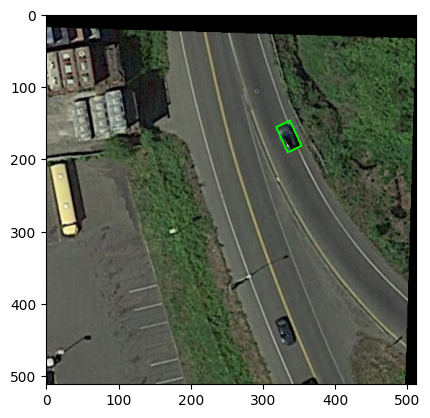

In [73]:
plt.imshow(image)

In [97]:
file_name = 'sample1_response.json'

In [111]:
import json
import pprint
with open(file_name, 'r') as f:
    data = json.load(f)

pprint .pprint(data)
    

{'input_image': {'image_id': 'sample1.png',
                 'image_url': 'https://bit.ly/4ouV45l',
                 'metadata': {'height': 512,
                              'spatial_resolution_m': 1.57,
                              'width': 512}},
 'queries': {'attribute_query': {'binary': {'instruction': 'Is there any digit '
                                                           'present in the '
                                                           'bottom right '
                                                           'corner of the '
                                                           'scene?',
                                            'response': 'Yes'},
                                 'numeric': {'instruction': 'How many storage '
                                                            'tanks are present '
                                                            'in the scene?',
                                             'response': 2.0},
      

In [121]:
bounding_box = data['queries']['grounding_query']['response'][1]['obbox']
pprint.pprint(bounding_box)

[0.4, 0.1, 0.09, 0.09, 0]


In [122]:
from PIL import Image
image = Image.open(data['input_image']['image_id'])
image = np.array(image.convert("RGB"))

In [131]:
import numpy as np

cx_n, cy_n, w_n, h_n, angle = 0.4, 0.1, 0.09, 0.09, 0
H, W = image.shape[:2]

cx = cx_n * W
cy = cy_n * H
bw = w_n * W
bh = h_n * H

In [132]:
theta = np.deg2rad(angle)

dx = bw / 2
dy = bh / 2

corners = np.array([
    [-dx, -dy],
    [ dx, -dy],
    [ dx,  dy],
    [-dx,  dy]
])

R = np.array([
    [ np.cos(theta), -np.sin(theta)],
    [ np.sin(theta),  np.cos(theta)]
])

rotated = corners @ R.T
rotated[:,0] += cx
rotated[:,1] += cy


In [133]:
x_min = rotated[:,0].min()
y_min = rotated[:,1].min()
x_max = rotated[:,0].max()
y_max = rotated[:,1].max()

input_box = np.array([x_min, y_min, x_max, y_max]).astype(int)

In [205]:
def place_crops_back_to_image(original_img: Union[str, Image.Image, np.ndarray],
                              processed_crops: List[Image.Image],
                              obboxes: List[List[float]]) -> Image.Image:
    """
    Takes processed crops and pastes them back into the original image
    using AABB coordinates computed from the obboxes.
    """
    # Load original image as PIL
    if isinstance(original_img, str):
        base = Image.open(original_img).convert("RGB")
    elif isinstance(original_img, Image.Image):
        base = original_img.convert("RGB")
    else:
        arr = original_img
        if arr.dtype != np.uint8:
            arr = (np.clip(arr, 0, 1) * 255).astype(np.uint8)
        base = Image.fromarray(arr).convert("RGB")

    # Iterate over crops and obboxes
    for crop, obbox in zip(processed_crops, obboxes):
        x_min, y_min, x_max, y_max = obbox_to_aabb_pixels(obbox, base)

        target_w = x_max - x_min + 1
        target_h = y_max - y_min + 1

        # Resize processed crop to exactly match the AABB region
        crop_resized = crop.resize((target_w, target_h), resample=Image.BICUBIC)

        # Paste back
        base.paste(crop_resized, (x_min, y_min))

    return base


In [206]:
if __name__ == "__main__":
    obboxes = [[0.5,0.17,0.08,0.08,-37.18],
               [0.4, 0.1, 0.09, 0.09, 0]]

    img_path = "/root/sample1.png"
    save_directory = "/root"

    crops = crop_and_process(
        img_path,
        obboxes,
        save_dir=save_directory,
        upscale=2.0,
        smoothing_backend="auto",
        smooth_method="nlmeans",
        gaussian_radius=0.8,
        bilateral_params=(9,75,75),
        nlm_h=10,
        unsharp_amount=0.6
    )

    # Place crops back into the original image
    final_img = place_crops_back_to_image(img_path, crops, obboxes)

    # Save the final updated image
    final_save_path = "/root/sample1_patched.png"
    final_img.save(final_save_path)

    print("Final patched image saved to:", final_save_path)


Final patched image saved to: /root/sample1_patched.png


In [215]:
import numpy as np
import cv2
from PIL import Image

# ------------------- BOUNDING BOX IS ALREADY KNOWN -------------------
# x_min, y_min, x_max, y_max = obbox_to_aabb_pixels(obbox, original_image)

def paste_mask_back(
    original_image: np.ndarray,     # BGR image
    crop_mask: np.ndarray,          # SAM mask on the cropped patch (Hc, Wc)
    crop_patch: np.ndarray,         # The cropped BGR image you passed to SAM (Hc, Wc, 3)
    bbox: tuple,                    # (x_min, y_min, x_max, y_max)
    color=(0,255,0),                # same palette SAM show_masks uses
    alpha=0.55                      # transparency for overlay
):
    """
    Applies the predicted mask back onto the original full-resolution image.
    The mask is assumed to be in crop-local coordinates.
    """
    x_min, y_min, x_max, y_max = bbox

    Hc, Wc = crop_mask.shape

    # ---------------- PUT CROP BACK TO FULL-IMAGE CANVAS ----------------
    # Region of interest in full image
    roi = original_image[y_min:y_max+1, x_min:x_max+1]

    # Resize mask to ROI dimensions (NEAREST to preserve segmentation edges)
    mask_resized = cv2.resize(
        crop_mask.astype(np.uint8),
        (roi.shape[1], roi.shape[0]),
        interpolation=cv2.INTER_NEAREST
    )

    # Resize processed crop back to ROI
    patch_resized = cv2.resize(
        crop_patch,
        (roi.shape[1], roi.shape[0]),
        interpolation=cv2.INTER_CUBIC
    )

    # ---------------- CREATE OVERLAY LIKE show_masks() ----------------
    overlay = roi.copy()
    overlay[mask_resized == 1] = color

    blended = roi.copy()
    blended[mask_resized == 1] = (
        alpha * overlay[mask_resized == 1] +
        (1 - alpha) * blended[mask_resized == 1]
    ).astype(np.uint8)

    # ---------------- OPTIONAL: replace masked area with processed patch ----------------
    final_roi = blended.copy()
    final_roi[mask_resized == 1] = patch_resized[mask_resized == 1]

    # ---------------- WRITE BACK TO ORIGINAL IMAGE ----------------
    output = original_image.copy()
    output[y_min:y_max+1, x_min:x_max+1] = final_roi

    return output


In [226]:
# 1. Load full-image
orig = cv2.imread("/root/sample1.png")
obbox = [0.5,0.17,0.08,0.08,-37.18]
# 2. Get AABB from your obbox
x_min, y_min, x_max, y_max = obbox_to_aabb_pixels(obbox, orig)

# 3. Extract the crop you fed to SAM
crop_patch = orig[y_min:y_max+1, x_min:x_max+1]    # BGR
# (This IS the region SAM was operating on)

# 4. Obtain mask from SAM predictor
mask_crop = masks[0]  # shape (Hc, Wc), values 0/1

# 5. Paste back
result = paste_mask_back(
    original_image=orig,
    crop_mask=mask_crop,
    crop_patch=crop_patch,
    bbox=(x_min, y_min, x_max, y_max),
    color=(0,255,0),
    alpha=0.55
)

cv2.imwrite("final_reintegrated2.png", result)


True

In [224]:
def paste_mask_back(
    original_image,
    crop_mask,
    crop_patch,
    bbox,
    color=(0,255,0),
    alpha=0.55
):
    x_min, y_min, x_max, y_max = bbox

    roi = original_image[y_min:y_max+1, x_min:x_max+1]

    mask_resized = cv2.resize(
        crop_mask.astype(np.uint8),
        (roi.shape[1], roi.shape[0]),
        interpolation=cv2.INTER_NEAREST
    )

    patch_resized = cv2.resize(
        crop_patch,
        (roi.shape[1], roi.shape[0]),
        interpolation=cv2.INTER_CUBIC
    )

    overlay = roi.copy()
    overlay[mask_resized == 1] = color

    blended = roi.copy()
    blended[mask_resized == 1] = (
        alpha * overlay[mask_resized == 1] +
        (1 - alpha) * blended[mask_resized == 1]
    ).astype(np.uint8)

    final_roi = blended.copy()
    final_roi[mask_resized == 1] = patch_resized[mask_resized == 1]

    output = original_image.copy()
    output[y_min:y_max+1, x_min:x_max+1] = final_roi
    
    return output
